# HW 5 SVM analysis of income data. 

### BY: Arash Hosseini Jafari

The purpose of this project is to build and train an SVM and a random forest model to predict income based on geographic and demographic information. 

#### Preprocessing: 

2 data sets were provided at the outset for training and testing. However, due to issues during preprocessing, there was an unresolvable missmatch in the feature count between the test and train data sets even though the column numbers matched. After spending a considerable amount of time trying to pinpoint the source of the problem amoung the 10s of thousads of rows of data, I descieded to simply combine the test and train data sets. I then created my own test, train split based on that agregate data set. 

#### Faramework: 

The SKLearn framework was used to perform all machine learning tasks. 

#### Other Packages:

Numpy was used for data handling. Matplotlib was used for basic visualization. Graphviz, Pydotplus, and Ipython were used to visualize the decision tree.

------------------------------------------

### 1) Importing all the necessary packages.

In [1]:
from sklearn import*

In [2]:
from sklearn.model_selection import train_test_split

In [3]:
from sklearn.preprocessing import LabelEncoder
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report


/anaconda3/envs/ml/lib/python3.6/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


### 2) Visualizing Data Set.
This data set (adult-data2.csv) is the agregate of both of the original test and train sets. 

In [4]:
import pandas as pd
import numpy as np
df = pd.read_csv("adult-data2.csv")
df.head(5)

,age,workclass,fnlwgt,education,education-num,marital_status,ocupation,relationship,race,sex,capital-gains,capital-loss,hours-per-week,country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [5]:
df.describe()

,age,fnlwgt,education-num,capital-gains,capital-loss,hours-per-week
count,32561.000000,3.256100e+04,32561.000000,32561.000000,32561.000000,32561.000000
mean,38.581647,1.897784e+05,10.080679,1077.648844,87.303830,40.437456
std,13.640433,1.055500e+05,2.572720,7385.292085,402.960219,12.347429
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178270e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783560e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370510e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
age               32561 non-null int64
workclass         32561 non-null object
fnlwgt            32561 non-null int64
education         32561 non-null object
education-num     32561 non-null int64
marital_status    32561 non-null object
ocupation         32561 non-null object
relationship      32561 non-null object
race              32561 non-null object
sex               32561 non-null object
capital-gains     32561 non-null int64
capital-loss      32561 non-null int64
hours-per-week    32561 non-null int64
country           32561 non-null object
salary            32561 non-null object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


### Visualizing Feature Imbalances

To visualize the classes and to determine where feature scaling is necessary I have produced several bar graph for every freature. 

In [18]:
list(df.columns)

['age',
 'workclass',
 'fnlwgt',
 'education',
 'education-num',
 'marital_status',
 'ocupation',
 'relationship',
 'race',
 'sex',
 'capital-gains',
 'capital-loss',
 'hours-per-week',
 'country',
 'salary']

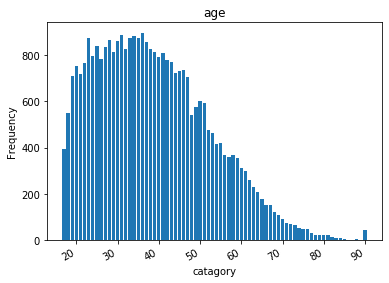

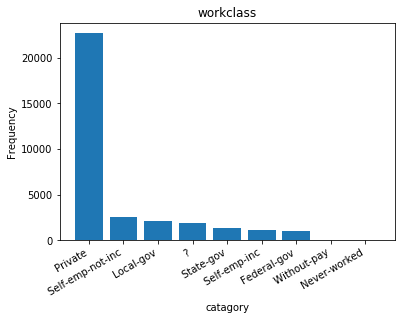

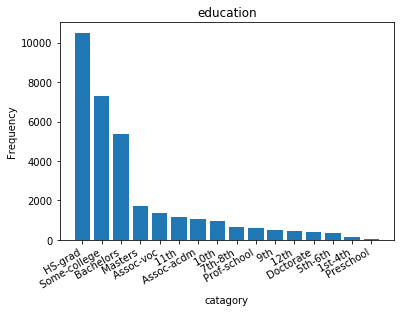

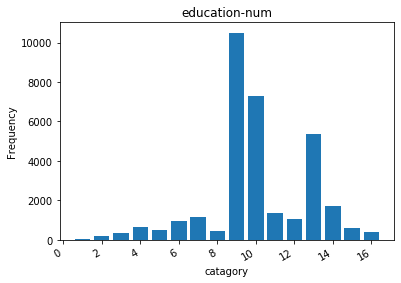

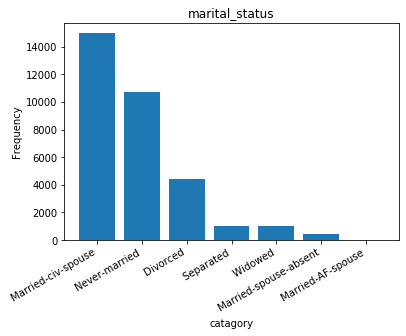

...

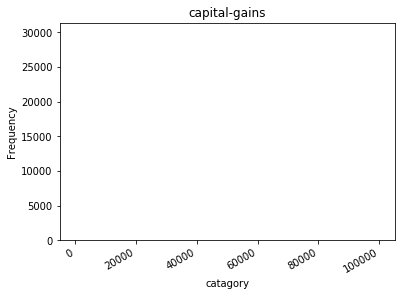

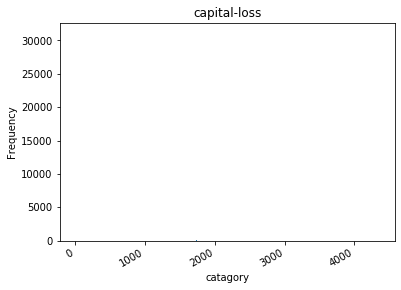

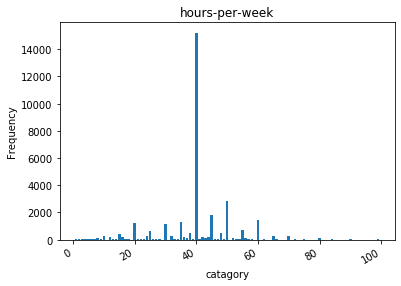

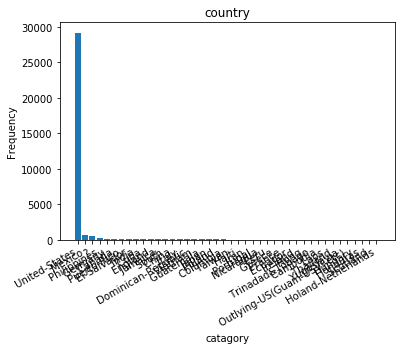

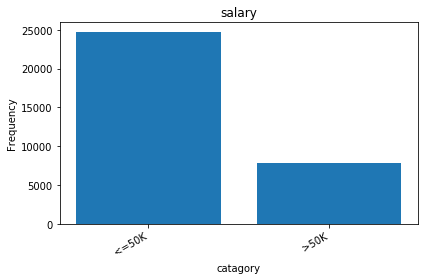

In [41]:
theFeatures = ['age',
 'workclass',
 'education',
 'education-num',
 'marital_status',
 'ocupation',
 'relationship',
 'race',
 'sex',
 'capital-gains',
 'capital-loss',
 'hours-per-week',
 'country',
 'salary']

for catz in theFeatures:
    # create a figure and axis 
    fig, ax = plt.subplots() 
    # count the occurrence of each class 
    data = df[catz].value_counts() 
    # get x and y data 
    points = data.index 
    frequency = data.values 
    # create bar chart 
    ax.bar(points,frequency) 
    # set title and labels 
    ax.set_title(catz) 
    ax.set_xlabel('catagory') 
    ax.set_ylabel('Frequency')
    plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
fig.tight_layout()


###### -  Box and whisker plots to visualize the distribution of Capital Gain Capital Loss and FNLWGT
These features seem to be continous and their distribution is better represented with box and wisker plots.

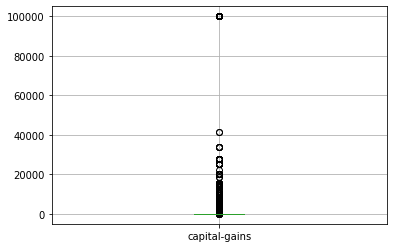

In [45]:
df.boxplot(column=['capital-gains'])

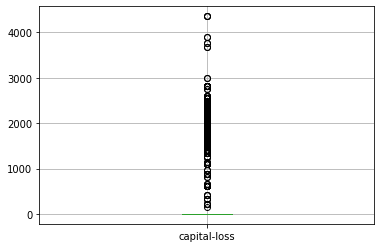

In [46]:
df.boxplot(column=['capital-loss'])

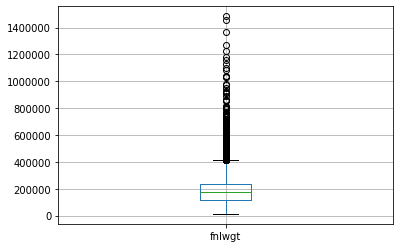

In [48]:
df.boxplot(column=['fnlwgt'])

### Visualization Conclusions:

(Scroll to see all graphs) From these 15 graphs we can see that the distribution of many features, such as age, are highly skewed. In addition sampling/data collection was biased as "whites" and people in the US are over represented. In addtion, a diproportionate ammount of respondents were private sector employees.

Lastly, the importance of capital-loss and capital-gain may be questionable as the mean, median, and perhaps mode is ALL centered around 0. There were very few individuals that capital gains and losses. Nevertheless, the uncomon-ness of the presence of capital-gain or capital-loss may indicate that they are potentially very LOW Entory and High information gain data points...and are unlikely to be low significance noise in income prediction models.

##### 3) Convering Catagorical Data Into Numbers.

I had initially set out to use label encoder function in sklearn but from reading resources online I saw that the best method to transform catagorical values to numerical ones was with the use of One hot encoding. In addtion to creating numerical values it also seperates those values into columns and further converts them into boolian values.



from sklearn.preprocessing import LabelEncoder
lleee = LabelEncoder()
lleee2= LabelEncoder()
df['workclass_n'] = lleee.fit_transform(df['workclass'])
df['education_n'] = lleee.fit_transform(df['education'])
df['marital_status_n'] = lleee.fit_transform(df['marital_status'])
df['ocupation_n'] = lleee.fit_transform(df['ocupation'])
df['relationship_n'] = lleee.fit_transform(df['relationship'])
df['race_n'] = lleee.fit_transform(df['race'])
df['sex_n'] = lleee.fit_transform(df['sex'])
df['country_n'] = lleee.fit_transform(df['country'])
df['salary_n'] = lleee.fit_transform(df['salary'])


In [51]:

df = pd.get_dummies(df)
print('Features after One-Hot Encoding:\n', list(df.columns))


Features after One-Hot Encoding:
 ['age', 'fnlwgt', 'education-num', 'capital-gains', 'capital-loss', 'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov', 'workclass_ Local-gov', 'workclass_ Never-worked', 'workclass_ Private', 'workclass_ Self-emp-inc', 'workclass_ Self-emp-not-inc', 'workclass_ State-gov', 'workclass_ Without-pay', 'education_ 10th', 'education_ 11th', 'education_ 12th', 'education_ 1st-4th', 'education_ 5th-6th', 'education_ 7th-8th', 'education_ 9th', 'education_ Assoc-acdm', 'education_ Assoc-voc', 'education_ Bachelors', 'education_ Doctorate', 'education_ HS-grad', 'education_ Masters', 'education_ Preschool', 'education_ Prof-school', 'education_ Some-college', 'marital_status_ Divorced', 'marital_status_ Married-AF-spouse', 'marital_status_ Married-civ-spouse', 'marital_status_ Married-spouse-absent', 'marital_status_ Never-married', 'marital_status_ Separated', 'marital_status_ Widowed', 'ocupation_ ?', 'ocupation_ Adm-clerical', 'ocupation_ Armed-Forc

In [52]:
y = df['salary_ >50K']
X = df.drop(['salary_ <=50K','salary_ >50K'], axis='columns')

In [53]:
#X_train, X_test, y_train, y_test = train_test_split(df., mnist["target"][:5000], test_size=0.2)

In [54]:
X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.2)

In [76]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26048 entries, 21795 to 17026
Columns: 108 entries, age to country_ Yugoslavia
dtypes: int64(6), uint8(102)
memory usage: 3.9 MB


In [79]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6513 entries, 18688 to 26039
Columns: 108 entries, age to country_ Yugoslavia
dtypes: int64(6), uint8(102)
memory usage: 1004.9 KB


In [56]:

#y_train = df['salary_ >50K']
#X_train = df.drop(['salary_ <=50K','salary_ >50K'],axis='columns')
#y_test = dft['salary_ >50K']
#X_test = dft.drop(['salary_ <=50K','salary_ >50K'],axis='columns')
print(X_train.columns)
print(X_test.columns)




Index(['age', 'fnlwgt', 'education-num', 'capital-gains', 'capital-loss',
       'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov',
       'workclass_ Local-gov', 'workclass_ Never-worked',
       ...
       'country_ Portugal', 'country_ Puerto-Rico', 'country_ Scotland',
       'country_ South', 'country_ Taiwan', 'country_ Thailand',
       'country_ Trinadad&Tobago', 'country_ United-States',
       'country_ Vietnam', 'country_ Yugoslavia'],
      dtype='object', length=108)
Index(['age', 'fnlwgt', 'education-num', 'capital-gains', 'capital-loss',
       'hours-per-week', 'workclass_ ?', 'workclass_ Federal-gov',
       'workclass_ Local-gov', 'workclass_ Never-worked',
       ...
       'country_ Portugal', 'country_ Puerto-Rico', 'country_ Scotland',
       'country_ South', 'country_ Taiwan', 'country_ Thailand',
       'country_ Trinadad&Tobago', 'country_ United-States',
       'country_ Vietnam', 'country_ Yugoslavia'],
      dtype='object', length=108)


In [80]:
X_train.head(10)

,age,fnlwgt,education-num,capital-gains,capital-loss,hours-per-week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,...,country_ Portugal,country_ Puerto-Rico,country_ Scotland,country_ South,country_ Taiwan,country_ Thailand,country_ Trinadad&Tobago,country_ United-States,country_ Vietnam,country_ Yugoslavia
21795,20,68358,10,0,0,12,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
15653,36,150042,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
30855,24,293091,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
21108,30,158200,15,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
23089,39,185099,13,0,0,48,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
6481,49,192349,14,4650,0,40,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
22126,37,174912,9,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
8944,19,112432,9,0,0,58,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
11855,19,214935,10,0,0,40,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
17744,41,150755,16,15024,0,50,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Random Forest

In [57]:
RandCLF = RandomForestClassifier(n_estimators=10)
RndTree = RandCLF.fit(X_train,y_train)
print (RndTree)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)


In [58]:
predictions = RndTree.predict(X_test)
print(predictions)

[0 1 0 ... 0 0 0]


In [59]:
import itertools


def Eval (model):

    predictions = model.predict(X_test)




    def plot_confusion_matrix(cm, classes,
                              normalize=False,
                              title='Confusion matrix',
                              cmap=plt.cm.Blues):
        """
        This function prints and plots the confusion matrix.
        Normalization can be applied by setting normalize=True.
        """
        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            print("\nNormalized confusion matrix")
        else:
            print('\nConfusion matrix, without normalization')

        #print(cm)

        plt.imshow(cm, interpolation='nearest', cmap=cmap)
        plt.title(title)
        plt.colorbar()
        tick_marks = np.arange(len(classes))
        plt.xticks(tick_marks, classes, rotation=45)
        plt.yticks(tick_marks, classes)

        fmt = '.2f' if normalize else 'd'
        thresh = cm.max() / 2.
        for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")

        plt.tight_layout()
        plt.ylabel('True label')
        plt.xlabel('Predicted label')



    
    print ("\nTrain Accuracy : ", accuracy_score(y_train, model.predict(X_train)))
    print ("\nTest Accuracy  : ", accuracy_score(y_test, predictions))
    confmat = confusion_matrix(y_test, predictions)
    #print (" Confusion matrix ", confmat)

        #plots confusion matrix non-normalized
    cm = metrics.confusion_matrix(y_test, predictions)
    plot_confusion_matrix(cm, ['<=50K','>50K'])
    plt.show()

    #plots confusion matrix normalized
    plot_confusion_matrix(cm, ['<=50K','>50K'], normalize=True)
    plt.show()

    
    from sklearn.metrics import classification_report
    
    print("\nCLASSIFICATION REPORT WITH PERCISION AND REACALL\n")
    target_names = ['<=50K','>50K']
    print(classification_report(y_test, predictions, target_names=target_names))
    
    print (" \nTHE MOST IMPORTANT  (features)")
    try:
        impz= model.feature_importances_
        print(impz)

    except:
        print( "\nFeature importance is not possible in this model\n" )


Train Accuracy :  0.9872542997542998

Test Accuracy  :  0.8483033932135728

Confusion matrix, without normalization


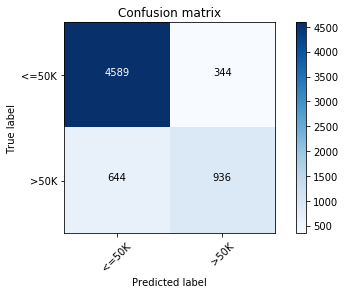


Normalized confusion matrix


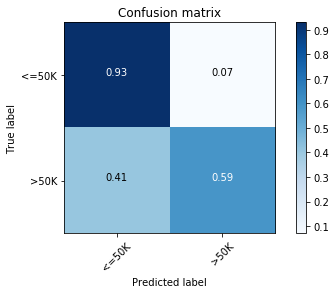


CLASSIFICATION REPORT WITH PERCISION AND REACALL

              precision    recall  f1-score   support

       <=50K       0.88      0.93      0.90      4933
        >50K       0.73      0.59      0.65      1580

    accuracy                           0.85      6513
   macro avg       0.80      0.76      0.78      6513
weighted avg       0.84      0.85      0.84      6513

 
THE MOST IMPORTANT  (features)
[1.42829380e-01 1.57752586e-01 5.75377447e-02 8.16183149e-02
 3.49384679e-02 8.57762951e-02 1.69832514e-03 5.48995987e-03
 5.63622531e-03 0.00000000e+00 1.03035364e-02 6.52478863e-03
 8.34154795e-03 4.30065513e-03 5.43635495e-05 1.40480650e-03
 1.67688807e-03 6.64125127e-04 4.07320344e-04 6.86458548e-04
 1.88030539e-03 1.56618305e-03 2.54688357e-03 2.85524849e-03
 1.25329890e-02 2.89743680e-03 5.91741483e-03 5.02158265e-03
 7.15165447e-05 5.75895746e-03 6.68581759e-03 3.73738244e-03
 6.68239194e-04 6.10341491e-02 1.06362293e-03 1.65597471e-02
 1.71643838e-03 1.58809808e-03 2.1997892

In [60]:
Eval(RndTree)

In [99]:

estimator = RndTree.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = list(X_train.columns),
                class_names = list(y_train.columns),
                rounded = True, proportion = False, 
                precision = 2, filled = True)
#graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
#Image(graph.create_png())
# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [61]:
from sklearn import svm

clf = svm.SVC(gamma='scale')
clfsvm= clf.fit(X_train, y_train)  
print (clfsvm)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)


svm_clf = svm.SVC(kernel="linear",)
mod = svm_clf.fit(X_train, y_train)

y_prediction = svm_clf.predict(X_test)
print ("Train Accuracy :: ", accuracy_score(y_train, svm_clf.predict(X_train)))
print ("Test Accuracy  :: ", accuracy_score(y_test, y_prediction))
print (" Confusion matrix ", confusion_matrix(y_test, y_prediction))


Train Accuracy :  0.7944947788697788

Test Accuracy  :  0.7957930293259634

Confusion matrix, without normalization


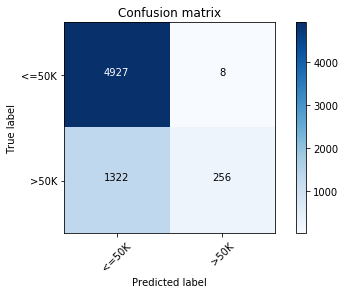


Normalized confusion matrix


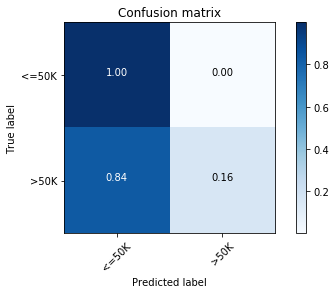


CLASSIFICATION REPORT WITH PERCISION AND REACALL

              precision    recall  f1-score   support

       <=50K       0.79      1.00      0.88      4935
        >50K       0.97      0.16      0.28      1578

    accuracy                           0.80      6513
   macro avg       0.88      0.58      0.58      6513
weighted avg       0.83      0.80      0.73      6513

 
THE MOST IMPORTANT  (features)

Feature importance is not possible in this model since it is unsupervised



In [45]:
Eval(clfsvm)

In [68]:
from sklearn.svm import LinearSVC
clf = LinearSVC(random_state=5, tol=1e-5)
print(clf)
SVM_Linear= clf.fit(X_train, y_train)  



print(clf.coef_)

print(clf.intercept_)



LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=5, tol=1e-05,
          verbose=0)
[[-4.77508685e-03 -2.14199864e-05 -1.88917106e-03  1.44908545e-04
   3.50200827e-04 -5.99448601e-03 -7.16280964e-05  1.65337468e-05
   1.09733032e-05 -4.42110989e-08 -3.00733147e-04  3.05466003e-05
  -2.28172790e-05  2.24253403e-07 -1.08342379e-06 -3.08737974e-05
  -4.59573478e-05 -2.07522859e-05 -2.10949700e-06 -4.36925682e-06
  -2.16219154e-05 -1.42098938e-05 -1.91367271e-05 -7.30721295e-06
   9.29927525e-05  2.21241932e-05 -1.90510676e-04  5.68053346e-05
  -7.72359899e-07  2.98343854e-05 -1.82163949e-04 -1.42330025e-04
   2.97104732e-06  3.40831558e-04 -1.43128238e-05 -4.63666921e-04
  -2.74186194e-05 -3.41024695e-05 -7.16723075e-05 -8.12615279e-05
  -1.21372406e-07 -3.97105334e-05  1.22577582e-04 -4.25629052e-05
  -5.52619637e-05 -3.46073192e-05 -1.68090770e-0

/anaconda3/envs/ml/lib/python3.6/site-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()

export_graphviz(RndTree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=False)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


Train Accuracy :  0.7669302825552825

Test Accuracy  :  0.7658529095654845

Confusion matrix, without normalization


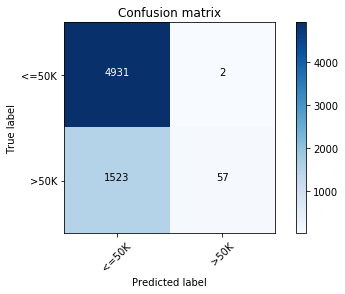


Normalized confusion matrix


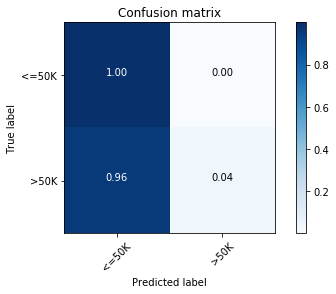


CLASSIFICATION REPORT WITH PERCISION AND REACALL

              precision    recall  f1-score   support

       <=50K       0.76      1.00      0.87      4933
        >50K       0.97      0.04      0.07      1580

    accuracy                           0.77      6513
   macro avg       0.87      0.52      0.47      6513
weighted avg       0.81      0.77      0.67      6513

 
THE MOST IMPORTANT  (features)

Feature importance is not possible in this model



In [69]:
Eval(SVM_Linear)